## Step 0 : Imports

In [1]:
from platform import python_version

print(python_version())

3.10.2


In [2]:
# Imports
import pmdarima as pmd
import numpy as np
import pandas as pd
import datetime as dt
from statsmodels.tsa.stattools import adfuller
import datetime as dt
from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from math import sqrt
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows',None)

## Step 1 : Functions

### 1.1 Error Metrics Functions

In [3]:
# MAPE Function
def mape(true,pred):
    """
    Returns Mean Absolute Percentage Error
    """
    ape = []
    for i in range(len(true)):
        per_err = abs((true[i] - pred[i]) / true[i])
        ape.append(per_err)
    mape = 100*sum(ape)/len(ape)
    #print("MAPE:",mape)
    return mape

# Residual Percentage Score
def res(true,pred):
    """
    Returns Mean Absolute Percentage Error
    """
    res = np.mean([(true[i]-pred[i])/true[i] for i in range(len(true))])*100
    return res



### 1.2 Stationarity Function

In [4]:
def test_stationarity(timeseries):
    """
    Returns dickey fuller statistics with the given input time series.
    """
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value',
                                             '#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

### 1.3 Forecasting Function

In [5]:
def forecast(df,ts,i,D_val=1):
    ''' 
    Create model based on Auto Arima 
    '''
    data = df.copy()
 
    #creating instance of autoarima model
    
#     iter_list = [3,4,5,13,14,15,18,20,23,24,25,33,35,64,73,393,394,1443,1444,1445,1453,1454,1455,1463,1464,1473,1474,1573,1574,1803,1805,1823,1824]  # got these numbers from the error faced in the "final loop function"
     
#     if i in iter_list:
#         model = pmd.auto_arima(data[['sum']] , start_p = 0 , start_q = 0 , max_p = 5 , max_q = 5 , start_P = 0 , D = 0 , start_Q = 0 , max_P = 5 , max_D = 5 , max_Q = 5 , m = 12 , 
#                            seasonal = True , trace=True , suppress_warnings=True, stepwise=True, verbose=False )
#     else :
    model = pmd.auto_arima(data[['sum']] , start_p = 0 , start_q = 0 , max_p = 5 , max_q = 5 , start_P = 0 , D = D_val , start_Q = 0 , max_P = 5 , max_D = 5 , max_Q = 5 , m = 12 , 
                           seasonal = True , trace=True , suppress_warnings=True, stepwise=True, verbose=False )
    #Create Columns
    residuals=model.resid()
    residuals[0]=residuals.mean()
    data['pred']=data['sum']+residuals
    data['Residual'] =residuals
    data.rename(columns={'sum':'Smoothened'}, inplace=True)
    data['Actual']=ts['sum']
    data=data[['Actual', 'Smoothened','pred', 'Residual']]
    return data, model

### 1.4 Forecast ahead function

In [6]:
def forecast_ahead(ts,window,model):
    '''
    Forecast Future values
    '''

    next_mnths = [i for i in get_next_months(ts.index[-1],window)]
    
    future_data = pd.DataFrame(index=next_mnths, columns=['Predicted'])
    future_data['Predicted'] = 0
    future_data['Predicted'] = model.predict(window)
    return future_data

### 1.5 Date Generator Function

In [7]:
def get_next_months(date, num):
    """
    Returns the generated next month dates.
    """
    for i in range(num):
        date += relativedelta(months =+1)
        yield (date)

### 1.6 Final Output Formation Function

In [8]:
def create_output(ts,pred,fcast,kpi,reg,pros,seg,cat,src,   lpci,lpi,devc,mrkt,#subm,
                  subm1,   smooth_data,op):
    """
    Returns the final output dataframe with proper formating.
    """
    
    # Date Selection
    start = pred.index[-1] + relativedelta(months=+1)
    start = start.strftime('%Y-%m-%d')
    last = pred.index[-1]
    
    # Output Formation
    temp_ts = ts.copy()
    temp_ts.rename(columns={'sum':'Actual'},inplace=True) # Rename Actuals
    temp_ts['Predicted'] = pred['pred'] # Rename Prediction
    temp_ts['Residual'] = temp_ts['Actual'] - temp_ts['Predicted'] # Add Residuals
    
    # For Future Forecasted Values
    temp_cast = fcast.loc[start:] 
    temp_cast['Actual'] = [0]*len(temp_cast) # 0 for Actuals
    temp_cast.rename(columns={'sum':'Predicted'},inplace=True)
    temp_cast['Residual'] = [0]*len(temp_cast) # 0 for residuals

    # For proper categorical values
    op_file = op.copy()
    temp_op= temp_ts.append(temp_cast)
    temp_op['KPI'] = [kpi]*len(temp_op) # KPI Values
    temp_op['d_traffic_source'] = [src]*len(temp_op)  # Traffic Source Values
    temp_op['d_prspct_chnl'] = [pros]*len(temp_op) # Added D Prospect for Ouptput
    temp_op['d_category'] = [cat]*len(temp_op) # Category Values
    temp_op['d_geo_cntry'] = [reg]*len(temp_op) # Region Values
    temp_op['d_segment'] = [seg]*len(temp_op) # Segment Values
    
    temp_op['d_landing_Page_Category'] = [lpci]*len(temp_op)
    temp_op['d_landing_page'] = [lpi]*len(temp_op)
    temp_op['d_devc_type_name'] = [devc]*len(temp_op)
    temp_op['d_market'] = [mrkt]*len(temp_op)
    #temp_op['d_sub_market'] = [subm]*len(temp_op)
    temp_op['d_sub_market_lvl_1'] = [subm1]*len(temp_op)
    
    temp_op.loc[:last,'Smoothened'] = smooth_data['sum'].values # Smooth Data Values
    temp_op.loc[start:,'Smoothened'] = [0]*len(temp_op.loc[start:]) # If smooth values are not present

    # Final Appending
    op_file = op_file.append(temp_op)
    op_file['Year'] = pd.to_datetime(op_file.index).year # Proper Year Values
    op_file['Month'] = pd.to_datetime(op_file.index).month # Proper Month Values
    
    op_file['Day'] = pd.to_datetime(op_file.index).day # Proper Month Values    
    
    op_file = op_file[['Year','Month','Day','d_geo_cntry','d_prspct_chnl','d_segment','d_category','d_traffic_source','d_landing_Page_Category','d_landing_page','d_devc_type_name','d_market',#'d_sub_market',
                       'd_sub_market_lvl_1','KPI',       ###'Spend'
                       'Actual','Predicted','Smoothened', 'Residual']]
    
    return op_file

## Step 2 : Inputs

### 2.1 Datewise Inputs

In [9]:
### Monthly Data Input

# Loading the data & Formatting
df = pd.read_excel('Dummy_Data.xlsx', sheet_name="Input_sheet")

In [10]:
df.shape

(15252, 18)

In [11]:
df.head(2)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Values,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17
0,Months,d_evnt_dt,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market,d_sub_market_lvl_1,d_segment,d_category,Sum of m_raw_prospects,Sum of m_qualified_prospects,Sum of m_signup_starts,Sum of m_signup_completes,Sum of m_30d_activations
1,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,CONSUMER,UPSELL,0,0,1,1,1


In [12]:
df.columns = df.iloc[0] # setting 1st row as the Column names
df = df.drop(index=0) # dropping the 1st row

In [13]:
df.head()

,Months,d_evnt_dt,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market,d_sub_market_lvl_1,d_segment,d_category,Sum of m_raw_prospects,Sum of m_qualified_prospects,Sum of m_signup_starts,Sum of m_signup_completes,Sum of m_30d_activations
1,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,CONSUMER,UPSELL,0,0,1,1,1
2,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,MERCHANT,PROSPECT,778,38,4,3,1
3,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,MERCHANT,UPSELL,0,0,17,9,3
4,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,OTHERS,US,CORE,NaN,US,MERCHANT,PROSPECT,10,0,0,0,0
5,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,NaN,US,CONSUMER,PROSPECT,2,2,2,1,0


In [14]:
df.shape 

(15251, 18)

In [15]:
# Create a Date-Time Column
df['date'] = '2022-' + df['d_evnt_dt']
df['date'] = df['date'].apply(lambda x: dt.datetime.strptime(x,'%Y-%d-%b'))

In [16]:
df.head(2)

,Months,d_evnt_dt,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market,d_sub_market_lvl_1,d_segment,d_category,Sum of m_raw_prospects,Sum of m_qualified_prospects,Sum of m_signup_starts,Sum of m_signup_completes,Sum of m_30d_activations,date
1,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,CONSUMER,UPSELL,0,0,1,1,1,2022-08-31
2,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,MERCHANT,PROSPECT,778,38,4,3,1,2022-08-31


In [17]:
df['year'] = pd.DatetimeIndex(df['date']).year
df['month'] = pd.DatetimeIndex(df['date']).month

df['ds'] = df['year'].astype(str) + '-' + df['month'].astype(str) + '-' + '01'
 
df['ds'] = df['ds'].apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d'))

df.head()

,Months,d_evnt_dt,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market,...,d_category,Sum of m_raw_prospects,Sum of m_qualified_prospects,Sum of m_signup_starts,Sum of m_signup_completes,Sum of m_30d_activations,date,year,month,ds
1,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,...,UPSELL,0,0,1,1,1,2022-08-31,2022,8,2022-08-01
2,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,...,PROSPECT,778,38,4,3,1,2022-08-31,2022,8,2022-08-01
3,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,...,UPSELL,0,0,17,9,3,2022-08-31,2022,8,2022-08-01
4,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,OTHERS,US,CORE,NaN,...,PROSPECT,10,0,0,0,0,2022-08-31,2022,8,2022-08-01
5,Aug,31-Aug,DIRECT,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,NaN,...,PROSPECT,2,2,2,1,0,2022-08-31,2022,8,2022-08-01


In [18]:
df.drop(['d_evnt_dt','Months','date','year','month'],axis=1,inplace=True)

df.sort_values(by='ds')

,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market,d_sub_market_lvl_1,d_segment,d_category,Sum of m_raw_prospects,Sum of m_qualified_prospects,Sum of m_signup_starts,Sum of m_signup_completes,Sum of m_30d_activations,ds
1,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,CONSUMER,UPSELL,0,0,1,1,1,2022-08-01
89,SEO,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,NaN,US,MERCHANT,UPSELL,0,0,29,11,4,2022-08-01
88,SEO,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,NaN,US,MERCHANT,PROSPECT,88,62,27,11,4,2022-08-01
87,SEO,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,NaN,US,CONSUMER,UPSELL,0,0,2,0,0,2022-08-01
86,SEO,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,NaN,US,CONSUMER,PROSPECT,4,4,4,0,0,2022-08-01
85,SEO,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,MERCHANT,UPSELL,0,0,40,32,18,2022-08-01
84,SEO,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,MERCHANT,PROSPECT,101,86,35,22,7,2022-08-01
83,SEO,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,CONSUMER,UPSELL,0,0,3,1,1,2022-08-01
82,SEO,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,NaN,US,CONSUMER,PROSPECT,2,2,2,2,2,2022-08-01
81,SEM,main:mktg,Website,main:mktg:business:product:business-getting-st...,SMARTPHONE,US,CORE,NaN,US,MERCHANT,PROSPECT,3,1,0,0,0,2022-08-01


In [19]:
print(df.d_sub_market.unique().tolist())

[nan]


In [20]:
df.drop(columns=['d_sub_market'] , inplace=True)

In [21]:
df.head(2)

,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market_lvl_1,d_segment,d_category,Sum of m_raw_prospects,Sum of m_qualified_prospects,Sum of m_signup_starts,Sum of m_signup_completes,Sum of m_30d_activations,ds
1,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,UPSELL,0,0,1,1,1,2022-08-01
2,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,MERCHANT,PROSPECT,778,38,4,3,1,2022-08-01


In [22]:
# Metlting the Data and Grouping By - Prospect Channel, Region, Visitor Type, Traffic Source, DS, KPI 
new_df = pd.melt(df,id_vars=['d_traffic_source','d_landing_Page_Category','d_prspct_chnl','d_landing_page','d_devc_type_name','d_geo_cntry','d_market','d_sub_market_lvl_1','d_segment','d_category','ds'],
                 var_name = 'KPI',value_name = 'Value')
new_df.head()

,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market_lvl_1,d_segment,d_category,ds,KPI,Value
0,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,UPSELL,2022-08-01,Sum of m_raw_prospects,0
1,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,MERCHANT,PROSPECT,2022-08-01,Sum of m_raw_prospects,778
2,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,MERCHANT,UPSELL,2022-08-01,Sum of m_raw_prospects,0
3,DIRECT,main:mktg,Website,main:mktg:business:product:business,OTHERS,US,CORE,US,MERCHANT,PROSPECT,2022-08-01,Sum of m_raw_prospects,10
4,DIRECT,main:mktg,Website,main:mktg:business:product:business,SMARTPHONE,US,CORE,US,CONSUMER,PROSPECT,2022-08-01,Sum of m_raw_prospects,2


In [23]:
# grouping

df_new = new_df.groupby(['d_traffic_source','d_landing_Page_Category','d_prspct_chnl','d_landing_page','d_devc_type_name','d_geo_cntry','d_market',
                         'd_sub_market_lvl_1','d_segment','d_category','ds','KPI']).sum().reset_index()

df_new.head()

,d_traffic_source,d_landing_Page_Category,d_prspct_chnl,d_landing_page,d_devc_type_name,d_geo_cntry,d_market,d_sub_market_lvl_1,d_segment,d_category,ds,KPI,Value
0,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,PROSPECT,2022-09-01,Sum of m_30d_activations,3
1,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,PROSPECT,2022-09-01,Sum of m_qualified_prospects,15
2,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,PROSPECT,2022-09-01,Sum of m_raw_prospects,15
3,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,PROSPECT,2022-09-01,Sum of m_signup_completes,13
4,DIRECT,main:mktg,Website,main:mktg:business:product:business,COMPUTER,US,CORE,US,CONSUMER,PROSPECT,2022-09-01,Sum of m_signup_starts,16


In [24]:
df_new.shape

(7460, 13)

## Step 3 : Filters

In [25]:
new_df.d_geo_cntry.unique()  # Regions we have in the dataset

array(['US'], dtype=object)

In [26]:
### Filter Values

# List of the Different Components

region= new_df.d_geo_cntry.unique().tolist()
kpi_list = new_df.KPI.unique().tolist()
traffic = new_df.d_traffic_source.unique().tolist()
catg =new_df.d_category.unique().tolist()
segment = new_df.d_segment.unique().tolist()
prospect = new_df.d_prspct_chnl.unique().tolist()

lpc = new_df.d_landing_Page_Category.unique().tolist()
lp = new_df.d_landing_page.unique().tolist()
device = new_df.d_devc_type_name.unique().tolist()
market = new_df.d_market.unique().tolist()

sub_market_lvl_1 =  new_df.d_sub_market_lvl_1.unique().tolist()


## Step 4 : Final Prediction

### 4.1 Final Loop Function

In [28]:
# Final Loop Function ( For Prediction & Forecast )
def final_loop(df_new,smooth_month, D_value=1):
    output_df = pd.DataFrame()
    i=0
    for reg in region:
        for pros in prospect:
            for cat in catg:
                for seg in segment: 
                    for trf in traffic:
                        for lpci in lpc:
                            for lpi in lp:
                                for devc in device:
                                    for mrkt in market:
                                        for subm1 in sub_market_lvl_1:
                                            for kpi in kpi_list:
                                                    
                                                # the iteration number
                                                i=i+1
                                                print(i)
                                                
                                                # Filtering the data
                                                data = df_new[(df_new['d_geo_cntry'] == reg)& 
                                                              (df_new['KPI'] == kpi) & 
                                                              (df_new['d_traffic_source'] == trf) &
                                                              (df_new['d_landing_Page_Category'] == lpci) & 
                                                              (df_new['d_landing_page'] == lpi) & 
                                                              (df_new['d_devc_type_name'] == devc) & 
                                                              (df_new['d_market'] == mrkt) &
                                                              (df_new['d_sub_market_lvl_1'] == subm1) &
                                                              (df_new['d_segment'] == seg) & 
                                                              (df_new['d_prspct_chnl'] == pros) & 
                                                              (df_new['d_category'] == cat)]

                                                
                            

#                                                 if ((len(data.Value.unique()) == 1) & (data.Value.unique()[0] == 0)):
#                                                     continue
                                                if len(data) <= 2 :
                                                    continue
                                                else:
                                                    ts = data.groupby('ds').sum() # Groupby
                                                    ts = ts.rename(columns={'Value':'sum'})

                                                    ts['sum'] = pd.to_numeric(ts['sum'],errors='coerce')
                                                    smooth_ts = ts.loc[:].rolling(window=smooth_month,center=True,min_periods=1).mean() # Smoothing
                                                    smooth_ts.iloc[0] = ts.iloc[0][0]





                                                print(f'{reg},{kpi},{trf},{lpci},{lpi},{devc},{mrkt},{subm1},{seg},{pros},{cat}') 
                                                print(smooth_ts)


                                                # Prediction & Forecast
                                                pred,model = forecast(smooth_ts,ts,i,D_value)
                                                fcast = forecast_ahead(ts,12,model)
                                                output_df = create_output(ts,pred,fcast,kpi,reg,pros,seg,cat,trf,lpci,lpi,devc,mrkt,
                                                                          subm1,smooth_ts,output_df)
    return output_df

### 4.2 Long Format Output

In [29]:
try:
    output = final_loop(df_new,3, 1)
    
except ValueError:
    output = final_loop(df_new,3 , 0)
    
    

1
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.02 sec
Total fit time: 0.016 seconds
2
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.018 seconds
3
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,CONSUMER,Website,UPSELL
              sum
ds               
2022-08-01  1.000
2022-09-01 33.667
2022-10-01 48.667
2022-11-01 58.667
2022-12-01 66.500
1
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=29.732, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.574 seconds
16
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.008 seconds
17
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.02 sec
Total fit time: 0.016 seconds
18
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 1.000
2022-10-01 1.333
2022-12-01 1.500
Performing stepwise search to minimize aic


34
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-10-01 3.000
2022-11-01 3.000
2022-12-01 3.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=17.105, Time=0.01 sec
Total fit time: 0.009 seconds
35
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-10-01 1.000
2022-11-01 0.333
2022-12-01 0.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=7.247, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=11.243, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=7.534, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.247, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.247, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12

504
505
506
507
508
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
553
554
555
556
557
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635
636
637
638
639
640
641
642
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
659
660
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
679
680
681
682
683
684
685
686
687
688
689
690
691
692
693
694
695
696
697
698
699
700
701
702
703
704
705
706
707
708
709
710
711
712
713
714
715
716
717
718
719
720
721
722
723
724
725
726
727
728
729
730
731
732
733
734
735
736
737
738
739
740
741
742
743
744
745
746
747
748
749
750
751
752
753


 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=37.201, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=33.040, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=33.040, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=35.040, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.400, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=32.200, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.734 seconds
1454
US,Sum of m_signup_completes,EXTERNAL,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.333
2022-10-01 1.000
2022-11-01 1.667
2022-12-01 2.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=15.447, T

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3.732, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=5.110, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=5.110, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7.110, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=4.456, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.747 seconds
1475
US,Sum of m_30d_activations,EXTERNAL,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-82.752, Time=0.02 sec
Total fit time: 0.016 seconds
1476
1477


 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.775 seconds
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
US,Sum of m_raw_prospects,SEM,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.008 seconds
1822
US,Sum of m_qualified_prospects,SEM,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.008 seconds
1823
US,Sum of m_signup_starts,SEM,main:mktg,main:mktg:business:product:business-

1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
US,Sum of m_raw_prospects,SEO,main:

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=50.436, Time=0.10 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.715 seconds
2174
US,Sum of m_signup_completes,SEO,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
              sum
ds               
2022-08-01  0.000
2022-09-01  8.000
2022-10-01 13.667
2022-11-01 18.667
2022-12-01 24.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=39.396, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=43.488, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=41.396, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=41.396, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=43.396, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=39.121, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf,

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=5.702, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4.805, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=3.705, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=3.705, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=5.705, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3.702, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.606 seconds
2186
2187
2188
2189
2190
2191
US,Sum of m_raw_prospects,SEO,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-82.752, Time=0.01 sec
Total fit time: 0.00

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=23.403, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=13.483, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=13.483, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=15.483, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=12.972, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.756 seconds
2254
US,Sum of m_signup_completes,SEO,main:mktg,main:mktg:business:product:business-getting-started,SMARTPHONE,CORE,US,CONSUMER,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.333
2022-12-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3.110, Time=0.01 s

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=71.031, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=67.203, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=67.203, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=69.203, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=65.741, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=66.676, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.705 seconds
2884
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,UPSELL
               sum
ds                
2022-08-01   9.000
2022-09-01 102.667
2022-10-01 147.667
2022-11-01 171.333
2022-12-01 183.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=14.992, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=5.110, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=5.110, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7.110, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=4.456, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.751 seconds
2900
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.333
2022-11-01 0.333
2022-12-01 0.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1.017, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=24.788, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=29.856, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=24.091, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=24.091, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=26.091, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=22.835, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=22.788, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=24.621, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.638 seconds
2915
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 1.000
2022-10-01 1.000
2022-11-01 1.000
2022-12-01 0.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercep

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.084, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=13.819, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=5.089, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=5.089, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7.089, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.084, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=6.352, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.865 seconds
2944
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business-contact-sales,COMPUTER,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-11-01 0.667
2022-12-01 1.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=7.247, Time=0.01 sec
 ARIMA(1,0,0)(1

2965
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business-getting-started,COMPUTER,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 3.000
2022-10-01 3.000
2022-11-01 2.333
2022-12-01 0.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=21.428, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=25.362, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=23.915, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=23.428, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=23.428, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=25.428, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=23.362, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=23.718, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Tot

3006
3007
3008
3009
3010
3011
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
3012
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
3013
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
              sum
ds               
2022-08-01  1.000
2022-09-01 38.667
2022-10-01 57.500
Performing stepwise search to minimize 

 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=53.103, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=57.057, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=59.171, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=55.103, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=55.103, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=57.103, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=55.057, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.490 seconds
3274
US,Sum of m_signup_completes,DISPLAY CT,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 1.000
2022-10-01 1.000
2022-11-01 2.000
2022-12-01 2.500
Performing s

4046
4047
4048
4049
4050
4051
4052
4053
4054
4055
4056
4057
4058
4059
4060
4061
4062
4063
4064
4065
4066
4067
4068
4069
4070
4071
4072
4073
4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
4181
4182
4183
4184
4185
4186
4187
4188
4189
4190
4191
4192
4193
4194
4195
4196
4197
4198
4199
4200
4201
4202
4203
4204
4205
4206
4207
4208
4209
4210
4211
4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4225
4226
4227
4228
4229
4230
4231
4232
4233
4234
4235
4236
4237
4238
4239
4240
4241
4242
4243
4244
4245


 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=18.075, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=13.019, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=13.019, Time=0.02 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=15.019, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=12.130, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.539 seconds
4336
US,Sum of m_raw_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
4337
US,Sum of m_qualified_prospects,EXTERNA

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=45.559, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=47.866, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=43.711, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=43.711, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=45.711, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=43.559, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=42.946, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=44.897, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.543 seconds
4354
US,Sum of m_signup_completes,EXTERNAL,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 1.000
2022-09-01 5.333
2022-10-01 6.333
2022-11-01 7.333
2022-12-01 7.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] inter

 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=26.884, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.456 seconds
4454
US,Sum of m_signup_completes,EXTERNAL,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 1.000
2022-10-01 0.667
2022-11-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3.089, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.084, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8.800, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=5.089, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=5.089, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7.089, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.084, Time=0

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=13.955, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17.105, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=12.609, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=12.609, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=14.609, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=11.958, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.561 seconds
4695
US,Sum of m_30d_activations,SEM,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 2.000
2022-10-01 0.667
2022-11-01 0.000
2022-12-01 0.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=13.730, Time=0.01 sec
 ARIMA(1,0

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=14.283, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=14.899, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=12.517, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=12.517, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=14.517, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=12.283, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.396 seconds
4716
US,Sum of m_raw_prospects,SEM,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
4717
US,Sum of m_qualified_pro

5046
5047
5048
5049
5050
5051
US,Sum of m_raw_prospects,SEO,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.011 seconds
5052
US,Sum of m_qualified_prospects,SEO,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.011 seconds
5053
US,Sum of m_signup_starts,SEO,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
               sum
ds                
2022-08-01  29.000
2022-09-01 447.333
2022-10-01 706.667
2022-11-01 765.333
2022-12-01 823.000
Performing stepwise search to mini

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=56.639, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=59.067, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=54.886, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=54.886, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=56.886, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=54.640, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=55.517, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.480 seconds
5064
US,Sum of m_signup_completes,SEO,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,MERCHANT,Website,UPSELL
              sum
ds               
2022-08-01  3.000
2022-09-01 51.667
2022-10-01 69.000
2022-11-01 61.000
2022-12-01 58.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercep

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=20.267, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17.345, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=18.272, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=18.272, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=20.272, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=18.267, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.392 seconds
5085
US,Sum of m_30d_activations,SEO,main:mktg,main:mktg:business:product:business-accept-payments/installments,COMPUTER,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 0.000
2022-09-01 1.000
2022-10-01 1.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9.680, Time=0.01 sec
 

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=9.607, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=16.835, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.455, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.455, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.455, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=7.736, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.526 seconds
5126
5127
5128
5129
5130
5131
US,Sum of m_raw_prospects,SEO,main:mktg,main:mktg:business:product:business-getting-started,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-82.752, Time=0.01 sec
Total fit time: 0.

US,Sum of m_qualified_prospects,SEO,main:mktg,main:mktg:business:product:business-website-payments,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.013 seconds
5153
US,Sum of m_signup_starts,SEO,main:mktg,main:mktg:business:product:business-website-payments,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 2.000
2022-10-01 3.000
2022-12-01 3.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9.680, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=13.675, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=16.904, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=11.680, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=11.680, Time=0.02 sec
 ARIMA(0,0,0)(1,0,1)[12

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=27.919, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=28.613, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=26.310, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=26.310, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=28.310, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=25.919, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.352 seconds
5195
US,Sum of m_30d_activations,SEO,main:mktg,main:mktg:business:product:invoicing-templates,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-08-01 1.000
2022-09-01 5.333
2022-10-01 5.000
2022-11-01 4.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=19.753, Time=0.01 sec

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8.321, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.247, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=9.243, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.587 seconds
5415
US,Sum of m_30d_activations,SOCIAL,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,UPSELL
             sum
ds              
2022-09-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.011 seconds
5416
5417
5418
5419
5420
5421
US,Sum of m_raw_prospects,SOCIAL,main:mktg,main:mktg:business:product:busine

5612
5613
5614
5615
5616
5617
5618
5619
5620
5621
5622
5623
5624
5625
5626
5627
5628
5629
5630
5631
5632
5633
5634
5635
5636
5637
5638
5639
5640
5641
5642
5643
5644
5645
5646
5647
5648
5649
5650
5651
5652
5653
5654
5655
5656
5657
5658
5659
5660
5661
5662
5663
5664
5665
5666
5667
5668
5669
5670
5671
5672
5673
5674
5675
5676
5677
5678
5679
5680
5681
5682
5683
5684
5685
5686
5687
5688
5689
5690
5691
5692
5693
5694
5695
5696
5697
5698
5699
5700
5701
5702
5703
5704
5705
5706
5707
5708
5709
5710
5711
5712
5713
5714
5715
5716
5717
5718
5719
5720
5721
5722
5723
5724
5725
5726
5727
5728
5729
5730
5731
5732
5733
5734
5735
5736
5737
5738
5739
5740
5741
5742
5743
5744
5745
5746
5747
5748
5749
5750
5751
5752
5753
5754
5755
5756
5757
5758
5759
5760
5761
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,CONSUMER,Website,PROSPECT
              sum
ds               
2022-09-01 15.000
2022-10-01 23.333
2022-11-01 25.667
2022-12-01 26.000
Performing stepwise 

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=53.929, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=49.800, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=49.800, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=51.800, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=49.240, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.361, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=50.006, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.533 seconds
5774
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,CONSUMER,Website,PROSPECT
              sum
ds               
2022-08-01  1.000
2022-09-01 22.333
2022-10-01 31.667
2022-11-01 31.667
2022-12-01 31.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC

 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=13.277, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=13.277, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=15.277, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=13.222, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.404 seconds
5784
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,CONSUMER,Website,PROSPECT
             sum
ds              
2022-09-01 1.000
2022-10-01 2.333
2022-11-01 3.333
2022-12-01 2.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=13.923, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=17.882, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=20.486, Time

5978
5979
5980
5981
5982
5983
5984
5985
5986
5987
5988
5989
5990
5991
5992
5993
5994
5995
5996
5997
5998
5999
6000
6001
6002
6003
6004
6005
6006
6007
6008
6009
6010
6011
6012
6013
6014
6015
6016
6017
6018
6019
6020
6021
6022
6023
6024
6025
6026
6027
6028
6029
6030
6031
6032
6033
6034
6035
6036
6037
6038
6039
6040
6041
6042
6043
6044
6045
6046
6047
6048
6049
6050
6051
6052
6053
6054
6055
6056
6057
6058
6059
6060
6061
6062
6063
6064
6065
6066
6067
6068
6069
6070
6071
6072
6073
6074
6075
6076
6077
6078
6079
6080
6081
6082
6083
6084
6085
6086
6087
6088
6089
6090
6091
6092
6093
6094
6095
6096
6097
6098
6099
6100
6101
6102
6103
6104
6105
6106
6107
6108
6109
6110
6111
6112
6113
6114
6115
6116
6117
6118
6119
6120
6121
6122
6123
6124
6125
6126
6127
6128
6129
6130
6131
6132
6133
6134
6135
6136
6137
6138
6139
6140
6141
6142
6143
6144
6145
6146
6147
6148
6149
6150
6151
US,Sum of m_raw_prospects,DISPLAY CT,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Web

6639
6640
6641
6642
6643
6644
6645
6646
6647
6648
6649
6650
6651
6652
6653
6654
6655
6656
6657
6658
6659
6660
6661
6662
6663
6664
6665
6666
6667
6668
6669
6670
6671
6672
6673
6674
6675
6676
6677
6678
6679
6680
6681
6682
6683
6684
6685
6686
6687
6688
6689
6690
6691
6692
6693
6694
6695
6696
6697
6698
6699
6700
6701
6702
6703
6704
6705
6706
6707
6708
6709
6710
6711
6712
6713
6714
6715
6716
6717
6718
6719
6720
6721
6722
6723
6724
6725
6726
6727
6728
6729
6730
6731
6732
6733
6734
6735
6736
6737
6738
6739
6740
6741
6742
6743
6744
6745
6746
6747
6748
6749
6750
6751
6752
6753
6754
6755
6756
6757
6758
6759
6760
6761
6762
6763
6764
6765
6766
6767
6768
6769
6770
6771
6772
6773
6774
6775
6776
6777
6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838


 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=37.248, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=33.272, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=33.272, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=35.272, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=30.560, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=30.015, Time=0.08 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec

Best model:  ARIMA(1,0,1)(0,0,0)[12] intercept
Tota

 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=22.444, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=20.311, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.348 seconds
7223
US,Sum of m_signup_starts,EXTERNAL,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,CONSUMER,Website,PROSPECT
             sum
ds              
2022-09-01 1.000
2022-10-01 3.333
2022-11-01 5.000
2022-12-01 4.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=18.444, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=22.311, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=23.696, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=20.444, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=20.444, Time=

 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.511 seconds
7236
7237
7238
7239
7240
7241
7242
7243
7244
7245
7246
7247
7248
7249
7250
7251
7252
7253
7254
7255
7256
7257
7258
7259
7260
7261
7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7278
7279
7280
7281
7282
7283
7284
7285
7286
7287
7288
7289
7290
7291
7292
7293
7294
7295
7296
7297
7298
7299
7300
7301
7302
7303
7304
7305
7306
7307
7308
7309
7310
7311
7312
7313
7314
7315
7316
7317
7318
7319
7320
7321
7322
7323
7324
7325
7326
7327
7328
7329
7330
7331
7332
7333
7334
7335
7336
7337
7338
7339
7340
7341
7342
7343
7344
7345
7346
7347
7348
7349
7350
7351
7352
7353
7354
7355
7356
7357
7358
7359
7360
7361
7362
7363
7364
7365
7366
7367
7368
7369
7370
7371
7372
7373
7374
7375
7376
7377
7378
7379
7380
7381
7382
7383
7384
7385
7386
7387
7388
7389
7390
7391
7392
7393
7394
739

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=23.086, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.435 seconds
7573
US,Sum of m_signup_starts,SEM,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,CONSUMER,Website,PROSPECT
             sum
ds              
2022-08-01 1.000
2022-09-01 3.333
2022-10-01 3.333
2022-11-01 2.333
2022-12-01 1.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=17.625, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=21.587, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=25.299, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=19.625, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=19.625, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=21.625, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=19.587, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time

7636
7637
7638
7639
7640
7641
7642
7643
7644
7645
7646
7647
7648
7649
7650
7651
7652
7653
7654
7655
7656
7657
7658
7659
7660
7661
7662
7663
7664
7665
7666
7667
7668
7669
7670
7671
7672
7673
7674
7675
7676
7677
7678
7679
7680
7681
7682
7683
7684
7685
7686
7687
7688
7689
7690
7691
7692
7693
7694
7695
7696
7697
7698
7699
7700
7701
7702
7703
7704
7705
7706
7707
7708
7709
7710
7711
7712
7713
7714
7715
7716
7717
7718
7719
7720
7721
7722
7723
7724
7725
7726
7727
7728
7729
7730
7731
7732
7733
7734
7735
7736
7737
7738
7739
7740
7741
7742
7743
7744
7745
7746
7747
7748
7749
7750
7751
7752
7753
7754
7755
7756
7757
7758
7759
7760
7761
7762
7763
7764
7765
7766
7767
7768
7769
7770
7771
7772
7773
7774
7775
7776
7777
7778
7779
7780
7781
7782
7783
7784
7785
7786
7787
7788
7789
7790
7791
7792
7793
7794
7795
7796
7797
7798
7799
7800
7801
7802
7803
7804
7805
7806
7807
7808
7809
7810
7811
7812
7813
7814
7815
7816
7817
7818
7819
7820
7821
7822
7823
7824
7825
7826
7827
7828
7829
7830
7831
7832
7833
7834
7835


 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=60.694, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=58.008, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=58.008, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=60.008, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=55.729, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=55.081, Time=0.08 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=57.452, Time=0.18 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=59.453, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=53.876, Time=0.06 sec
 ARIMA(1,0,1)(1,0,0)[12]             : AIC=

 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.445 seconds
7938
US,Sum of m_signup_starts,SEO,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,CONSUMER,Website,PROSPECT
             sum
ds              
2022-09-01 6.000
2022-10-01 5.667
2022-11-01 4.333
2022-12-01 2.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=18.972, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=25.845, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=20.972, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=20.972, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=22.972, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=20.521, Time=0.03 sec
 ARIMA(0,0,1)(0,0

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=24.083, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=23.349, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=22.088, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=22.088, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=24.088, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=22.083, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.498 seconds
7952
US,Sum of m_qualified_prospects,SEO,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Website,PROSPECT
              sum
ds               
2022-09-01  3.000
2022-11-01  8.667
2022-12-01 11.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=20.088, Time=0.01 sec


 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=6.972, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=6.972, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=8.972, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6.738, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.458 seconds
8005
US,Sum of m_30d_activations,SEO,main:mktg,main:mktg:business:product:business-getting-started,COMPUTER,CORE,US,CONSUMER,Website,PROSPECT
             sum
ds              
2022-09-01 0.000
2022-10-01 0.333
2022-11-01 0.333
2022-12-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1.705, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=5.702, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4.805, Time=0.01 sec
 

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=13.675, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=15.392, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=11.680, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=11.680, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=13.680, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=11.675, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.534 seconds
8312
US,Sum of m_qualified_prospects,SOCIAL,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,CONSUMER,Website,PROSPECT
             sum
ds              
2022-09-01 3.000
2022-10-01 2.000
2022-12-01 1.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9.680, Time=0.01 sec
 AR

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=73.862, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=70.348, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=70.348, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=72.348, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=70.347, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.491 seconds
8644
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01   3.000
2022-09-01 262.333
2022-10-01 298.333
2022-11-01 273.000
2022-12-01 164.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=65.065, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : A

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=84.933, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=80.840, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=80.840, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=82.840, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.311, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.453 seconds
8653
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01  10.000
2022-09-01 162.667
2022-10-01 221.000
2022-11-01 238.333
2022-12-01 235.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=62.756, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AI

 ARIMA(1,0,0)(1,0,1)[12]             : AIC=28.800, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12]          
Total fit time: 1.194 seconds
8660
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.667
2022-11-01 0.667
2022-12-01 1.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9.026, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=12.061, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=11.322, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=11.026, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=11.026, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=13.026, Time=0.

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=39.436, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=34.816, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=34.816, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=36.816, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=32.917, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=32.166, Time=0.08 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=33.882, Time=0.20 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=35.899, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec

Best model:  ARIMA(1,0,1)(0,0,0)[12] intercept
Total fit time: 1.198 seconds
8668
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business-accept-p

8677
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  1.000
2022-09-01 10.000
2022-10-01 14.000
2022-11-01 15.000
2022-12-01 15.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=35.067, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=37.375, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=41.324, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=37.067, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=37.067, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=39.067, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=36.089, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=35.375, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=36.716, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=25.205, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=25.692, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=25.692, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=27.692, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=25.688, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.487 seconds
8687
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments/installments,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
8688
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:prod

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.547 seconds
8698
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments/installments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
8699
US,Sum of m_signup_completes,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments/installments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
8700
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business-accept-payments/installments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=15.850, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.487 seconds
8706
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business-contact-sales,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  2.000
2022-09-01 18.667
2022-10-01 22.667
2022-11-01 22.000
2022-12-01 18.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=38.437, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=42.337, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=42.019, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=45.312, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=40.437, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=40.437, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=42.437, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=40.337, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] inte

8716
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business-contact-sales,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 6.000
2022-10-01 5.333
2022-11-01 4.333
2022-12-01 3.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=14.965, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=26.042, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=16.965, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=16.965, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=18.965, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=16.093, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.518 seconds


8726
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business-getting-started,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01   9.000
2022-09-01 627.000
2022-10-01 684.333
2022-11-01 378.000
2022-12-01 221.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=73.467, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=77.430, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=77.479, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=75.467, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=75.467, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=77.467, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=75.430, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] inte

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=25.084, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=19.633, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=19.633, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=21.633, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=18.811, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.452 seconds
8737
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business-getting-started,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 3.000
2022-10-01 2.667
2022-11-01 2.333
2022-12-01 2.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=4.148, Time=0.

 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=19.074, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=19.074, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=21.074, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=19.074, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=18.738, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=20.714, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.291 seconds
8745
US,Sum of m_30d_activations,DIRECT,main:mktg,main:mktg:business:product:business-website-payments,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.012 seconds
8746
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:business-website-payments,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds        

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=58.817, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=58.656, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=57.113, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=57.113, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=59.113, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=56.817, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.395 seconds
8762
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01   3.000
2022-09-01 101.333
2022-10-01 100.333
2022-11-01  67.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12

8772
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  5.000
2022-09-01 73.333
2022-10-01 71.667
2022-11-01 51.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=41.884, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=45.548, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=45.740, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=43.884, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=43.884, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=45.884, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=43.548, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] in

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=17.255, Time=0.03 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=14.639, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=15.263, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=15.263, Time=0.02 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=17.263, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=15.255, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.436 seconds
8786
US,Sum of m_raw_prospects,DIRECT,main:mktg,main:mktg:business:product:invoicing-templates,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-09-01 19.000
2022-10-01 36.000
2022-11-01 44.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=26.680, Time=0.01 sec
 ARIMA(1,0,0

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=36.428, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=32.584, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=32.584, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=34.584, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=32.583, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.489, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.442 seconds
8802
US,Sum of m_qualified_prospects,DIRECT,main:mktg,main:mktg:business:product:subscription-payments,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 1.000
2022-09-01 3.000
2022-10-01 2.667
2022-11-01 2.333
2022-12-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=17.939, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept 

8823
US,Sum of m_signup_starts,DIRECT,main:mktg,main:mktg:business:product:business-contact-sales/thank-you,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 1.000
2022-12-01 1.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=11.899, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=12.521, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=13.899, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=13.899, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=15.899, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=13.245, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.

 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=29.803, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=29.803, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=31.803, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=29.803, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=30.927, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.375 seconds
9003
US,Sum of m_signup_starts,DISPLAY CT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.012 seconds
9004
US,Sum of m_signup_completes,DISPLAY CT,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=17.380, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17.565, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=15.381, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=15.381, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=17.381, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=15.380, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=17.105, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.481 seconds
9018
US,Sum of m_signup_starts,DISPLAY CT,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.012 seconds

9029
US,Sum of m_signup_completes,DISPLAY CT,main:mktg,main:mktg:business:product:business-accept-payments,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.013 seconds
9030
US,Sum of m_30d_activations,DISPLAY CT,main:mktg,main:mktg:business:product:business-accept-payments,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.01 sec
Total fit time: 0.012 seconds
9031
US,Sum of m_raw_prospects,DISPLAY CT,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
                 sum
ds                  
2022-08-01   385.000
2022-09-01  9798.333
2022-10-01 12334.000
2022-11-01 16222.333


9039
US,Sum of m_signup_completes,DISPLAY CT,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.333
2022-10-01 0.333
2022-11-01 0.333
2022-12-01 0.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=0.068, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3.792, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2.649, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=2.068, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=2.068, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=4.068, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1.792, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fi

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=38.940, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=34.744, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=34.744, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=36.744, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=33.569, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.894, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.520 seconds
9077
US,Sum of m_qualified_prospects,DISPLAY CT,main:mktg,main:mktg:business:product:business-contact-sales,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 1.000
2022-09-01 2.667
2022-10-01 4.000
2022-11-01 4.667
2022-12-01 5.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept 

 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=25.747, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=25.747, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=27.747, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=25.346, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=25.085, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=26.833, Time=0.03 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.272 seconds
9722
US,Sum of m_qualified_prospects,EMAIL,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 8.000
2022-10-01 5.333
2022-11-01 4.000
2022-12-01 3.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=20.386, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=23.905, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=23.695, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=26.870, Time=0.01

9737
US,Sum of m_qualified_prospects,EMAIL,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.013 seconds
9738
US,Sum of m_signup_starts,EMAIL,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.012 seconds
9739
US,Sum of m_signup_completes,EMAIL,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-61.564, Time=0.01 sec
Total fit time: 0.011 seconds
9740
US,Sum of m_30d_activations,EMAIL,main:mktg,main:mktg:business:product:bus

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=13.372, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.247, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.247, Time=0.02 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.247, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=9.243, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.564 seconds
9792
US,Sum of m_qualified_prospects,EMAIL,main:mktg,main:mktg:business:product:business-contact-sales,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 1.000
2022-10-01 0.667
2022-12-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3.089, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.084, Time=0.13 sec
 ARIMA(0,0

 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=42.949, Time=0.14 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=44.949, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.194 seconds
10085
US,Sum of m_30d_activations,EXTERNAL,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 2.667
2022-10-01 3.667
2022-11-01 4.333
2022-12-01 3.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=22.330, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=25.396, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=27.858, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=24.330, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=24.330, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=26.330

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=37.397, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=33.298, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=33.298, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=35.298, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.780, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=31.811, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.536 seconds
10098
US,Sum of m_signup_starts,EXTERNAL,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.667
2022-10-01 1.667
2022-11-01 1.333
2022-12-01 1.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=13.381, Time=

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=19.172, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=8.746, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=8.746, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=10.746, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=8.395, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.580 seconds
10107
US,Sum of m_qualified_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business-accept-payments,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
2022-12-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-82.752, Time=0.01 sec
Total fit time: 0.012 seconds
10108
US,Sum of m_signup_starts,EXTERNAL,main:mktg,main:mktg:busine

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=46.971, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.581 seconds
10117
US,Sum of m_qualified_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 2.000
2022-10-01 3.667
2022-11-01 4.667
2022-12-01 5.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=24.367, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=28.954, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=26.367, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=26.367, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=28.367, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=24.162, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] interc

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=11.243, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8.321, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.247, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=9.243, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.602 seconds
10126
10127
10128
10129
10130
10131
US,Sum of m_raw_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business-accept-payments/installments,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  1.000
2022-09-01 18.000
2022-10-01 18.000
2022-11-01 13.500
Performing stepwise search to minimize aic
 ARIMA(0

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=31.370, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=35.098, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=29.979, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=29.979, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=31.979, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=29.402, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=29.370, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=31.221, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.478 seconds
10152
US,Sum of m_qualified_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business-contact-sales,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 1.333
2022-10-01 2.333
2022-11-01 3.333
2022-12-01 5.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] i

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=11.243, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=15.962, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.247, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=9.243, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.627 seconds
10166
10167
10168
10169
10170
10171
US,Sum of m_raw_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business-getting-started,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-09-01 20.000
2022-10-01 11.000
2022-11-01  5.333
2022-12-01  2.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=33.258, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=33.962, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=33.962, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=35.962, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=33.961, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.400 seconds
10202
US,Sum of m_qualified_prospects,EXTERNAL,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  2.000
2022-09-01 18.333
2022-10-01 26.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=26.4

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=10.350, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.250, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.250, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.250, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=9.247, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.484 seconds
10215
US,Sum of m_30d_activations,EXTERNAL,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-82.752, Time=0.01 sec
Total fit time: 0.012 seconds
10216
10217
10218
10219
10220
10221
US,Sum of m_ra

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.554 seconds
10234
US,Sum of m_signup_completes,EXTERNAL,main:mktg,main:mktg:business:product:invoicing-templates,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.333
2022-10-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3.089, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.084, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4.162, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=5.089, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=5.089, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7.089, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.084, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(

 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=9.243, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.503 seconds
10447
US,Sum of m_qualified_prospects,SEM,main:mktg,main:mktg:business:product:business,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 0.000
2022-10-01 0.667
2022-11-01 1.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=7.247, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=11.243, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8.321, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=9.247, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=11.247, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] inte

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=16.319, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.386 seconds
10457
US,Sum of m_qualified_prospects,SEM,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 1.000
2022-10-01 1.000
2022-11-01 1.000
2022-12-01 1.000
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=13.352, Time=0.01 sec
Total fit time: 0.006 seconds
10458
US,Sum of m_signup_starts,SEM,main:mktg,main:mktg:business:product:business,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 0.000
2022-10-01 0.000
2022-11-01 0.333
2022-12-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3.110, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3.732, Time=0.01 sec
 ARIMA(0,0,0

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=36.639, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.510 seconds
10467
US,Sum of m_qualified_prospects,SEM,main:mktg,main:mktg:business:product:business-accept-payments,OTHERS,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.333
2022-10-01 0.333
2022-11-01 2.333
2022-12-01 3.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=21.381, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=22.571, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=23.381, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=23.381, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=25.381, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=21.780, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept  

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=44.448, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=43.162, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=42.452, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=42.452, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=44.452, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=42.448, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.368 seconds
10478
US,Sum of m_signup_starts,SEM,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-09-01 10.000
2022-10-01  3.333
2022-11-01  2.667
2022-12-01  4.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=23.938, Time=

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=42.375, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=43.697, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=43.697, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=45.697, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=42.110, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=41.085, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=45.086, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=42.768, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 0.850 seconds
10513
US,Sum of m_signup_starts,SEM,main:mktg,main:mktg:business:product:business-contact-sales,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.000
2022-10

 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.399 seconds
10532
US,Sum of m_qualified_prospects,SEM,main:mktg,main:mktg:business:product:business-getting-started,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  1.000
2022-09-01  7.667
2022-10-01 11.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=21.063, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=25.058, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=22.810, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=23.063, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=23.063, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=25.063, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=23.058, Time=0.05 sec

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.447 seconds
10805
US,Sum of m_30d_activations,SEO,main:mktg,main:mktg:business:product:business,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01   7.000
2022-09-01 199.667
2022-10-01 324.333
2022-11-01 321.667
2022-12-01 335.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=66.509, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=72.123, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=68.509, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=68.509, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=70.509, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=67.474, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=82.317, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=79.001, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=79.001, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=81.001, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=77.312, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.521 seconds
10814
US,Sum of m_signup_completes,SEO,main:mktg,main:mktg:business:product:business,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01  11.000
2022-09-01 246.333
2022-10-01 402.000
2022-11-01 549.000
2022-12-01 644.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=

 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=14.135, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=18.001, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=24.374, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=16.135, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=16.135, Time=0.02 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=18.135, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=16.001, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=17.541, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.478 seconds
10821
US,Sum of m_raw_prospects,SEO,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01  13.000
2022-09-01 185.000
2022-10-01 251.000
2022-11-01 247.667
2022-12-01 252.000
Perf

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=75.795, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=75.736, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=75.736, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=77.736, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=73.759, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.498 seconds
10832
US,Sum of m_qualified_prospects,SEO,main:mktg,main:mktg:business:product:business-accept-payments,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01   1.000
2022-09-01  46.000
2022-10-01  71.333
2022-11-01 276.333
2022-12-01 378.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12]

 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=10.414, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=13.913, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12]          
Total fit time: 1.454 seconds
10839
US,Sum of m_signup_completes,SEO,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 0.333
2022-10-01 0.667
2022-11-01 0.667
2022-12-01 1.000
Performing stepwise search to minim

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=36.850, Time=0.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=37.200, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=37.200, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=39.200, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=37.196, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.368 seconds
10853
US,Sum of m_signup_starts,SEO,main:mktg,main:mktg:business:product:business-accept-payments/installments,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  0.000
2022-09-01 15.667
2022-10-01 23.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=26.189, Time=0.01

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=45.582, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=45.663, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=45.663, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=47.663, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=43.591, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=46.883, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=44.461, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=42.661, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=inf, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=46.256, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=35.664, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=32.418, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=32.418, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=34.418, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.002, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=31.434, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.535 seconds
10884
US,Sum of m_signup_completes,SEO,main:mktg,main:mktg:business:product:business-getting-started,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 2.333
2022-10-01 3.000
2022-11-01 4.000
2022-12-01 3.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : A

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.084, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=15.478, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=5.089, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=5.089, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7.089, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.084, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.587 seconds
10897
US,Sum of m_qualified_prospects,SEO,main:mktg,main:mktg:business:product:business-getting-started,TABLET,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-09-01 1.000
2022-10-01 2.000
2022-11-01 2.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9.680, Time=0.01 sec
 ARIMA(1,0,0)(

 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=7.752, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=9.728, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.368 seconds
10906
10907
10908
10909
10910
10911
US,Sum of m_raw_prospects,SEO,main:mktg,main:mktg:business:product:business-website-payments,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  1.000
2022-09-01 20.333
2022-10-01 22.000
2022-11-01 14.667
2022-12-01  5.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=39.248, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=43.227, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=43.122, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=43.353, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=41.248, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=41.248, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=43.248, Time=0.03 

 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.410 seconds
10922
US,Sum of m_qualified_prospects,SEO,main:mktg,main:mktg:business:product:business-website-payments/online-checkout,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  2.000
2022-09-01 26.667
2022-10-01 39.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=28.913, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=30.355, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=30.913, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=30.913, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=32.913, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=30.909, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, T

10936
10937
10938
10939
10940
10941
US,Sum of m_raw_prospects,SEO,main:mktg,main:mktg:business:product:invoicing-templates,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01  30.000
2022-09-01 420.000
2022-10-01 412.000
2022-11-01 313.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=55.852, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=59.564, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=59.830, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=57.852, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=57.852, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=59.852, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=57.564, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12

 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=28.754, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=30.754, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=28.589, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.356 seconds
10955
US,Sum of m_30d_activations,SEO,main:mktg,main:mktg:business:product:invoicing-templates,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 4.000
2022-10-01 4.000
2022-11-01 3.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=19.466, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=23.316, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=22.966, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=21.466, Time=0.03 

10973
US,Sum of m_signup_starts,SEO,main:mktg,main:mktg:business:product:subscription-payments,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 0.000
2022-09-01 1.333
2022-10-01 1.333
2022-12-01 1.000
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=10.517, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=14.283, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=13.872, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=12.517, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=12.517, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=14.517, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=12.283, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.417 seco

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=48.179, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=45.553, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=45.553, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=47.553, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=43.504, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=46.531, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=43.969, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=43.032, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.259 seconds
11172
US,Sum of m_qualified_pr

11182
US,Sum of m_qualified_prospects,SOCIAL,main:mktg,main:mktg:business:product:business-accept-payments,COMPUTER,CORE,US,MERCHANT,Website,PROSPECT
              sum
ds               
2022-08-01  0.000
2022-09-01  6.333
2022-10-01 10.000
2022-11-01 10.333
2022-12-01 12.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=32.981, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=37.813, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=38.139, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=34.981, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=34.981, Time=0.01 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=36.981, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=33.797, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=34.239, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]

 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=0.622, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=2.068, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=2.068, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=4.068, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2.061, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.490 seconds
11196
US,Sum of m_raw_prospects,SOCIAL,main:mktg,main:mktg:business:product:business-accept-payments,TABLET,CORE,US,MERCHANT,Website,PROSPECT
               sum
ds                
2022-08-01   9.000
2022-09-01 108.333
2022-10-01 128.667
2022-11-01 115.000
2022-12-01 123.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=56.144, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercep

 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.947, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=10.170, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=6.148, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=6.148, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=8.148, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.947, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 0.475 seconds
11253
US,Sum of m_signup_starts,SOCIAL,main:mktg,main:mktg:business:product:business-getting-started,SMARTPHONE,CORE,US,MERCHANT,Website,PROSPECT
             sum
ds              
2022-08-01 1.000
2022-09-01 0.667
2022-10-01 0.333
2022-11-01 0.500
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=4.148, Time=0.02 

In [30]:
# output = final_loop(df_new,3)

In [31]:
output.to_excel('Output_AutoArima_Dummy_Data_Final.xlsx',index=False)

In [38]:
def plot_pivot(df): #creating a pivot table to get an overall pivot chart
    df.dropna(inplace=True)
    df = df[df['Actual'] !=0]
    df = df.groupby(['Year', 'Month'])['Actual','Predicted'].sum().reset_index()
    plt.plot(df['Actual'])
    plt.plot(df['Predicted'])

def result(df): #printing different metrics
        print("MAPE=",mape_overall(df))
        print("Accuracy=", accuracy(df))
        print("Pivot Plot:")
        plot_pivot(df)    
def accuracy(df): #calculating accuracy of the model i.e. mape of the overall pivoted data
    df.dropna(inplace=True)
    df = df[df['Actual'] !=0]
    df = df.groupby(['Year', 'Month'])['Actual','Predicted'].sum().reset_index()
    return(mape(df['Actual'],df['Predicted']))

def mape_overall(df): #calculating the mape of data from 2019 to 2022
    df.dropna(inplace=True)
    df = df[df['Actual'] !=0]
    return mape(df['Actual'], df['Predicted'])

MAPE= 20.080066976688382
Accuracy= 11.552292519080247
Pivot Plot:


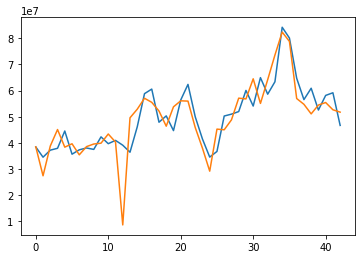

In [39]:
result(output)

In [19]:
# # Plots

# def plot_1(output_df,reg,pros,seg,cat,trf,kpi):
#     """
#     Returns Evaluation Metrics & Plots for Actual, Prediction & Smoothened Data
#     """
#     tab = output_df[(output_df['Region'] == reg)& (output_df['KPI']==kpi) & (output_df['TrafficSource']==trf) 
#                     & (output_df['Prospect']==pros) & (output_df['Category']==cat) & (output_df['Segment']==seg)]
    
#     # Plot 1
#     plt.figure(figsize=(16,9))
#     plt.plot(tab.index[:24],tab['Actual'].iloc[:24],marker='o',label = 'Actual',color='green')
#     plt.plot(tab.index[:24],tab['Predicted'].iloc[:24],marker='o',label = 'Forecasted',color='red')
#     plt.plot(tab.index[:24],tab['Smoothened'].iloc[:24],marker='o',label='Smoothened',color='blue',linestyle='dashed')
#     plt.legend(loc='best')
    
#     # Result
#     return eval_metrics(tab['Actual'].iloc[:24],tab['Predicted'].iloc[:24])

# def plot_2(output_df,reg,pros,seg,cat,trf,kpi):
#     """
#     Returns the Plot for Actual & Prediction 
#     """
#     tab = output_df[(output_df['Region'] == reg)& (output_df['KPI']==kpi) & (output_df['TrafficSource']==trf) 
#                     & (output_df['Prospect']==pros) & (output_df['Category']==cat) & (output_df['Segment']==seg)]
    
#     # Plot 2
#     plt.figure(figsize=(16,9))
#     plt.plot(tab.index[:24],tab['Actual'].iloc[:24],marker='o',label = 'Actual',color='green')
#     plt.plot(tab.index[24:],tab['Predicted'].iloc[24:],marker='o',label = 'Forecasted',color='red')
#     plt.legend(loc='best');

In [98]:
output_upto_2022[output_upto_2022['Year']==2022]

,Year,Month,Region,Prospect,Segment,Category,TrafficSource,KPI,Actual,Smoothened,Predicted,Residual
2022-01-01,2022,1,DE,Web,Consumer,Prospect,SEO,RP,125177.000,115142.667,100105.293,25071.707
2022-02-01,2022,2,DE,Web,Consumer,Prospect,SEO,RP,113369.000,113017.333,99957.801,13411.199
2022-03-01,2022,3,DE,Web,Consumer,Prospect,SEO,RP,100506.000,102490.333,95428.295,5077.705
2022-04-01,2022,4,DE,Web,Consumer,Prospect,SEO,RP,93596.000,100228.333,97939.899,-4343.899
2022-05-01,2022,5,DE,Web,Consumer,Prospect,SEO,RP,106583.000,101950.667,94881.519,11701.481
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-01,2022,8,US,MWeb,Consumer,Existing_Member,SEO,d90_activations,0.000,466.000,1880.477,-1880.477
2022-09-01,2022,9,US,MWeb,Consumer,Existing_Member,SEO,d90_activations,0.000,0.000,1906.952,0.000
2022-10-01,2022,10,US,MWeb,Consumer,Existing_Member,SEO,d90_activations,0.000,0.000,1898.648,0.000
2022-11-01,2022,11,US,MWeb,Consumer,Existing_Member,SEO,d90_activations,0.000,0.000,1754.327,0.000


# Step 5 : Meltdown Output ( Short Format )

### 5.1 Meltdown Function

In [43]:
# Function for melting the Output
def melted_values(df,value):
    # Melt the Dataset
    final_df = pd.melt(df,id_vars=['Year','Month','Region','Prospect','Segment','Category','TrafficSource','KPI'],
                       var_name = 'Value Type',value_name = 'Value')
    # Add Smooth By Column
    final_df['Smooth By'] = "{} Months".format(value)
    
    # Add Date Columns
    final_df['date_'] = pd.to_datetime(final_df[['Year', 'Month']].assign(DAY=1))
    
    # Hardcode Value Types
    final_df['Year'] = final_df['Year'].astype(int)
    final_df['Month'] = final_df['Month'].astype(int)
    final_df['Value'] = final_df['Value'].fillna(0).round(0).astype(int)
    
    # Rename Columns
    final_df.rename(columns={'Month': 'mnth', 'Prospect': 'Prospect_Channel', 
                             'Category':'Visitor_Type','Value Type':'Value_Type',
                             'Smooth By':'Smooth_By','TrafficSource':'Traffic_Source'},inplace=True)
    # Reorder Columns
    data = final_df[['date_','Year', 'mnth', 'Region', 'Segment','Prospect_Channel','Traffic_Source', 
              'Visitor_Type', 'KPI', 'Value_Type', 'Value', 'Smooth_By']]
    
    return data

### 5.2 Meltdown for Input Up To 2022

In [44]:
# Calling out Meltdown Function
melted_output_upto_2022 = melted_values(output_upto_2022,3)
melted_output_upto_2022['Traffic_Source'].replace('Marketing','Marketing-MLR',inplace=True)
melted_output_upto_2022

,date_,Year,mnth,Region,Segment,Prospect_Channel,Traffic_Source,Visitor_Type,KPI,Value_Type,Value,Smooth_By
0,2020-01-01,2020,1,Rest-CORE,Merchant,Web,SEO,Prospect,RP,Spend,549884,3 Months
1,2020-02-01,2020,2,Rest-CORE,Merchant,Web,SEO,Prospect,RP,Spend,534440,3 Months
2,2020-03-01,2020,3,Rest-CORE,Merchant,Web,SEO,Prospect,RP,Spend,1094444,3 Months
3,2020-04-01,2020,4,Rest-CORE,Merchant,Web,SEO,Prospect,RP,Spend,704785,3 Months
4,2020-05-01,2020,5,Rest-CORE,Merchant,Web,SEO,Prospect,RP,Spend,531587,3 Months
...,...,...,...,...,...,...,...,...,...,...,...,...
24955,2022-08-01,2022,8,UK,Merchant,MWeb,SEO,Existing_Member,d90_activations,Residual,0,3 Months
24956,2022-09-01,2022,9,UK,Merchant,MWeb,SEO,Existing_Member,d90_activations,Residual,0,3 Months
24957,2022-10-01,2022,10,UK,Merchant,MWeb,SEO,Existing_Member,d90_activations,Residual,0,3 Months
24958,2022-11-01,2022,11,UK,Merchant,MWeb,SEO,Existing_Member,d90_activations,Residual,0,3 Months


In [45]:
melted_output_upto_2022.to_csv('predicted-seo-data-07-07-2022.csv')

### 5.3 Rollup Melted Data ( Prospect_Channel )

In [81]:
# # Rolling up with pivot table
# rolled_data = pd.pivot_table(melted_output_upto_2022, index=['date_', 'Year', 'mnth', 'Region', 'Segment',
#        'Traffic_Source', 'Visitor_Type', 'KPI', 'Value_Type',
#        'Smooth_By'], values=['Value'], aggfunc=np.sum )

# # Converting to proper datarame
# rolled_data = pd.DataFrame(rolled_data.to_records())
# rolled_data

,date_,Year,mnth,Region,Segment,Traffic_Source,Visitor_Type,KPI,Value_Type,Smooth_By,Value
0,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Actual,3 Months,5613
1,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Predicted,3 Months,7054
2,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Residual,3 Months,-1441
3,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Smoothened,3 Months,5613
4,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Spend,3 Months,269686
...,...,...,...,...,...,...,...,...,...,...,...
36995,2023-01-01,2023,1,US,Merchant,SEO,Prospects,d90_activations,Actual,3 Months,0
36996,2023-01-01,2023,1,US,Merchant,SEO,Prospects,d90_activations,Predicted,3 Months,-277
36997,2023-01-01,2023,1,US,Merchant,SEO,Prospects,d90_activations,Residual,3 Months,0
36998,2023-01-01,2023,1,US,Merchant,SEO,Prospects,d90_activations,Smoothened,3 Months,0


## Step 6: Marketing Manual Forecast Meltdown

In [82]:
# # Melt Columns
# data_melt = pd.melt(marketing_forecast,id_vars=['ProspectChannel','Country','Cut','Channel','KPIs'],
#         var_name = 'Months',value_name = 'Value')

# # Add a new Column
# data_melt['Year'] = 2022

# # Replace Values in Columns
# data_melt['Value_Type'] = 'Predicted'
# data_melt['Segment'] = 'Merchant' # New Column Addition

# # Rename Columns
# data_melt.rename(columns={'Months':'mnth','Country':'Region',
#                           'ProspectChannel':'Prospect_Channel','Channel':'Traffic_Source',
#                           'Cut':'Visitor_Type','KPIs':'KPI'},inplace=True)

# # Replace the Columns Values
# d = {'Jan':1, 'Feb':2, 'Mar':3, 'Apr':4, 'May':5, 'Jun':6, 'Jul':7, 'Aug':8,'Sep':9, 'Oct':10, 
#      'Nov':11, 'Dec':12}
# data_melt['Month'] = data_melt['mnth'].map(d)

# # Add Date Column
# data_melt['date_'] = pd.to_datetime(data_melt[['Year', 'Month']].assign(DAY=1))

# # Changes for Inputs and Columns
# data_melt.drop(columns=['mnth'], inplace=True)
# data_melt.rename(columns={'Month':'mnth'},inplace=True)

# # Change Columns Values
# data_melt['Traffic_Source'] = 'Marketing'
# data_melt['Smooth_By'] = 'None'
# data_melt['Prospect_Channel'] = 'MWeb+Web'

# # Change Values in Columns
# data_melt['Region'].replace({'DEATCH':'DE','R-CORE':'Rest-CORE'},inplace=True)
# #data_melt['Visitor_Type'].replace({'Prospects':'Prospect','Existing':'Existing_Member'},inplace=True)
# data_melt['Value'] = data_melt['Value'].round(0).astype(int)

# # Rearaange Columns
# data_melt = data_melt[['date_','Year','mnth', 'Region', 'Segment', 'Traffic_Source', 'Visitor_Type',
#                        'KPI', 'Value_Type', 'Value', 'Smooth_By']]
# marketing_prediction_meltdown = data_melt

In [83]:
# marketing_prediction_meltdown

,date_,Year,mnth,Region,Segment,Traffic_Source,Visitor_Type,KPI,Value_Type,Value,Smooth_By
0,2022-01-01,2022,1,INTL,Merchant,Marketing,Prospects,RP,Predicted,5301183,None
1,2022-01-01,2022,1,INTL,Merchant,Marketing,Prospects,QP,Predicted,565050,None
2,2022-01-01,2022,1,INTL,Merchant,Marketing,Prospects,SS,Predicted,308189,None
3,2022-01-01,2022,1,INTL,Merchant,Marketing,Prospects,SC,Predicted,58330,None
4,2022-01-01,2022,1,INTL,Merchant,Marketing,Prospects,30D,Predicted,6522,None
...,...,...,...,...,...,...,...,...,...,...,...
595,2022-12-01,2022,12,DE,Merchant,Marketing,Prospects,12mon Rev,Predicted,25979,None
596,2022-12-01,2022,12,DE,Merchant,Marketing,Existing,SS,Predicted,6190,None
597,2022-12-01,2022,12,DE,Merchant,Marketing,Existing,SC,Predicted,1761,None
598,2022-12-01,2022,12,DE,Merchant,Marketing,Existing,30D,Predicted,120,None


## Step 7 : Combining Outputs

### 7.1 Meltdown Combination

In [84]:
# # Combining Meltdown Data Up To 2022 with Marketing Meltdown Data
# combined_output_second = pd.concat([rolled_data,marketing_prediction_meltdown])
# combined_output_second.reset_index(drop=['index'], inplace=True)

### 7.2 Final Changes  

In [85]:
# # Filter Values (actual and predicted)
# combined_output_second = combined_output_second[(combined_output_second['Value_Type'] == 'Actual') |
#                                                (combined_output_second['Value_Type'] == 'Predicted')]

# # Filter Values (actual and predicted)
# combined_output_second = combined_output_second[~(combined_output_second['KPI'] == 'd90_activations') ]

# # Rename Values
# combined_output_second['KPI'].replace({'d30_activations':'30DA','30D':'30DA','12mon Rev':'12MR'},inplace=True)
# combined_output_second['Region'].replace({'Rest-CORE':'R-CORE'},inplace=True)

# # Final Column Selection
# combined_output_second = combined_output_second[['date_', 'Year', 'mnth', 'Region', 'Segment', 'Traffic_Source',
#        'Visitor_Type', 'KPI', 'Value_Type', 'Value']]

In [86]:
# combined_output_second

,date_,Year,mnth,Region,Segment,Traffic_Source,Visitor_Type,KPI,Value_Type,Value
0,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Actual,5613
1,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SC,Predicted,7054
5,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SS,Actual,33128
6,2020-01-01,2020,1,DE,Merchant,Direct,Existing,SS,Predicted,48598
10,2020-01-01,2020,1,DE,Merchant,Direct,Existing,30DA,Actual,2520
...,...,...,...,...,...,...,...,...,...,...
37595,2022-12-01,2022,12,DE,Merchant,Marketing,Prospects,12MR,Predicted,25979
37596,2022-12-01,2022,12,DE,Merchant,Marketing,Existing,SS,Predicted,6190
37597,2022-12-01,2022,12,DE,Merchant,Marketing,Existing,SC,Predicted,1761
37598,2022-12-01,2022,12,DE,Merchant,Marketing,Existing,30DA,Predicted,120


### 7.3 Meltdown Combination Outputs (CSV Format)

In [88]:
#combined_output_second
#combined_output_second.to_csv('combined_final_output.csv',index=False)